In [1]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install plotly
!pip install scikit-learn
!pip install scipy

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
from sklearn.mixture import GaussianMixture
from scipy import stats
from scipy.optimize import fsolve
from scipy.stats import norm

In [3]:
# TO-DO:
# Change the directory accordingly to the folder on your system.

sample_data_path = '02-05-2023/sample_take_2/'
zone_0_folder_path = '02-05-2023/zone_0_sample_take_2/'

In [4]:
# Get a list of all files in the directory
file_list = os.listdir(sample_data_path)

# Sort the list of files (Necessary on Linux)
file_list.sort()

# Print the list of files
file_list

['goes15.2016.12.08.1200.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1300.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1500.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1530.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1545.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1600.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1615.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1630.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1645.v01.nc-var1-t0.csv',
 'goes15.2016.12.08.1700.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1200.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1400.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1415.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1430.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1445.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1500.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1530.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1545.v01.nc-var1-t0.csv',
 'goes15.2016.12.09.1600.v01.nc-var1-t0.csv',
 'goes15.2016.12.10.1300.v01.nc-var1-t0.csv',
 'goes15.2016.12.11.1400.v01.nc-var1-t0.csv',
 'goes15.2016.12.11.1415.v01.nc-va

In [5]:
prefix_dict = {}
first_index_list = []

for i, filename in enumerate(file_list):
    prefix = filename[:18]
    if prefix in prefix_dict:
        continue
    else:
        prefix_dict[prefix] = i
        first_index_list.append(i)

num_groups = len(first_index_list)

print('Number of days in the dataset: ', num_groups)

print(first_index_list)

Number of days in the dataset:  13
[0, 10, 19, 20, 28, 36, 48, 51, 55, 58, 61, 64, 67]


In [6]:
# Get the boundaries
LP = pd.read_csv('/srv/scratch/NOAA/Lake_Partition.csv')
LP

,latitude,first_bound,second_bound,left_zone,mid_zone,right_zone
0,40.06,-87.5465,-84.8170,2,3,4
1,40.10,-87.5465,-84.8170,2,3,4
2,40.14,-87.5465,-84.8170,2,3,4
3,40.18,-87.5465,-84.8170,2,3,4
4,40.22,-87.5465,-84.8170,2,3,4
...,...,...,...,...,...,...
193,47.78,-86.1781,-84.9473,6,6,6
194,47.82,-86.1781,-84.9473,6,6,6
195,47.86,-86.1781,-84.9473,6,6,6
196,47.90,-86.1781,-84.9473,6,6,6


---

## 0. Clean & Extract Lake Michigan Data

In [7]:
# # Create the directory if it doesn't exist
# if not os.path.exists(zone_0_folder_path):
#     os.makedirs(zone_0_folder_path)
#     print('New folder created!')
# else:
#     # Delete all files in the directory if it already exists
#     print("Folder exists, now deleting existing files.")
#     for file in os.listdir(zone_0_folder_path):
#         file_path = os.path.join(zone_0_folder_path, file)
#         try:
#             if os.path.isfile(zone_0_folder_path):
#                 os.remove(zone_0_folder_path)
#         except Exception as e:
#             print(e)


In [8]:
# for fn in file_list:
#     file = pd.read_csv(sample_data_path+fn)
#     flp = pd.merge(file, LP, on = 'latitude')
#     par_list = []
#     for i in range(len(flp)):
#         a = flp['longitude'][i] 
#         b = flp['first_bound'][i]
#         c = flp['second_bound'][i]
#         if a < b:
#             par_list.append(flp['left_zone'][i])
#         elif a > c:
#             par_list.append(flp['right_zone'][i])
#         else:
#             par_list.append(flp['mid_zone'][i])
#     flp['partition'] = par_list
#     flp = flp.loc[:, ['value', 'datetime', 'latitude', 'longitude', 'partition']]
#     s_flp = flp[flp['partition'] == 0].reset_index().rename(columns={'index': 'corresponding row'})
    
#     ## TO-DO: Change the directory, clearly lable as "zone_0"
#     s_flp.to_csv(zone_0_folder_path+str(fn),index = False)
#     print(fn)

Since there is no difference in file names, we can retrieve the `zone 0` files just by changing the parent directory path.

---

## Let's look into the cases

There are `13` days in the tester pack, and we will perform analysis on them.

---

## 1. Case 1

`Duration`: 2016.12.08 1200-1600 UTC

<img src="02-05-2023/testing_img/goes15.2016.12.08.1500.v01.nc.png" alt="image" width="50%">

> [Q]:

> This is a LLAP (Long-Lake Axis Parallel) cloud. However, at the time 1500 UTC, aka 10AM CDT, the intensity of the cloud decreased when compared to the intensity values in the hour before and after it. If we set a high threshold, it would lead to the possibility that 1500 UTC would not have any cloud at all.

> [A]:

> Yes, this is a good use case. I think we need to ensure that the threshold is not higher than the 1500 image, because that is a definite cloud

### 1.1 2016.12.08.1200

But before this, let's take a look at what happened at `1200`.

<img src="02-05-2023/testing_img/goes15.2016.12.08.1200.v01.nc.png" alt="image" width="50%">

As we can see, there are blue noises on the image in the Lake Michigan area.

(2346, 2346, 2346)

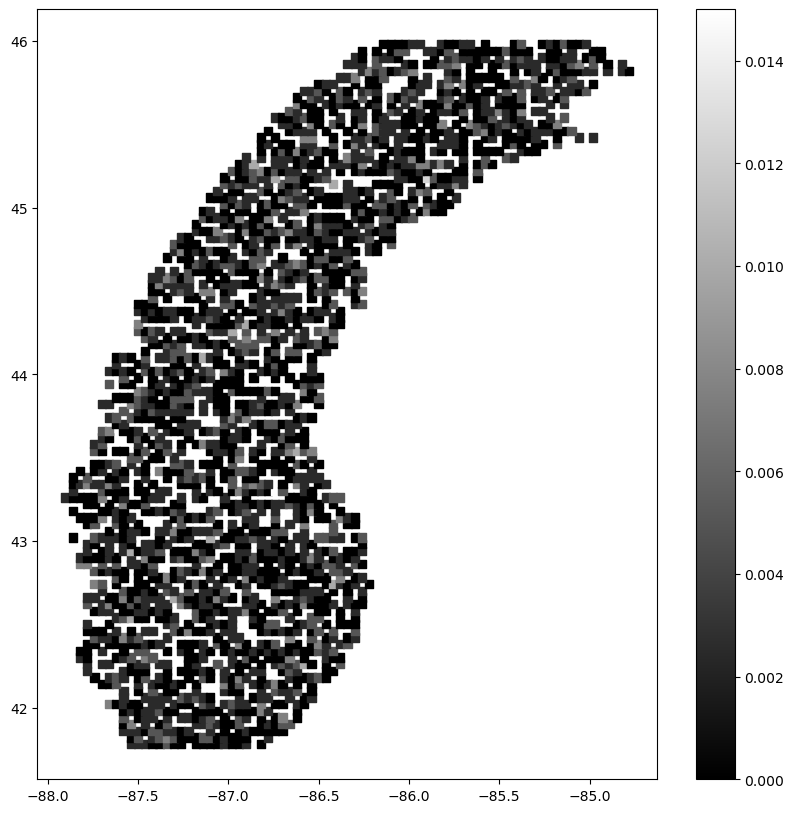

In [9]:
df_0 = pd.read_csv(zone_0_folder_path + file_list[0])

x_0, y_0, i_0 = df_0.longitude, df_0.latitude, df_0.value
plt.figure(figsize=(10, 10))
plt.scatter(x_0.values, y_0.values, c=i_0.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_0), len(y_0), len(i_0)

In [10]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_0 = np.nanmean(i_0.values)
std_i_0 = np.nanstd(i_0.values)

# Check number of nan values and 0s in i, just in case
num_nan_0 = i_0.isna().sum().sum()
num_zeros_0 = (i_0 == 0).sum().sum()

# Check min and max in i

i_0_max = i_0.max().max()
i_0_min = i_0.min().min()
i_0_mode = i_0.mode()[0]

print('Number of nan values in i_0 = ', num_nan_0)
print('Number of 0 values in i_0 = ', num_zeros_0)
print('Number of values in i_0 = ', len(i_0))
print('------------------------------------------------------')
print('Mean of values in i_0 = ', mean_i_0)
print('STD of 1-D values in i_0 = ', std_i_0)
print('Mean value >= STD =====> ', mean_i_0 >= std_i_0)
print('------------------------------------------------------')
print("Max value in i_0 = ", i_0_max)
print("Min value in i_0 = ", i_0_min)
print('Mode value in i_0 = ', i_0_mode)

Number of nan values in i_0 =  0
Number of 0 values in i_0 =  1066
Number of values in i_0 =  2346
------------------------------------------------------
Mean of values in i_0 =  0.0020428388742540497
STD of 1-D values in i_0 =  0.0022900731580302335
Mean value >= STD =====>  False
------------------------------------------------------
Max value in i_0 =  0.015
Min value in i_0 =  0.0
Mode value in i_0 =  0.0


In [11]:
# # Plot histogram
# plt.hist(i_0.values.flatten(), bins=50)

# # Set plot labels and title
# plt.xlabel('Value')
# plt.ylabel('Count')
# plt.title('Distribution of Values in DataFrame i_0')

# # Display plot
# plt.show()

fig = px.histogram(i_0.values.flatten(), title="Histogram of i_0")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

### 1.2 2016.12.08.1300

At `1300`, we assume that the sun is going up since **13:00 UTC** is **8:00 CDT**.

<img src="02-05-2023/testing_img/goes15.2016.12.08.1300.v01.nc.png" alt="image" width="50%">

Most of the Lake Michigan area is still covered in darkness.

(3558, 3558, 3558)

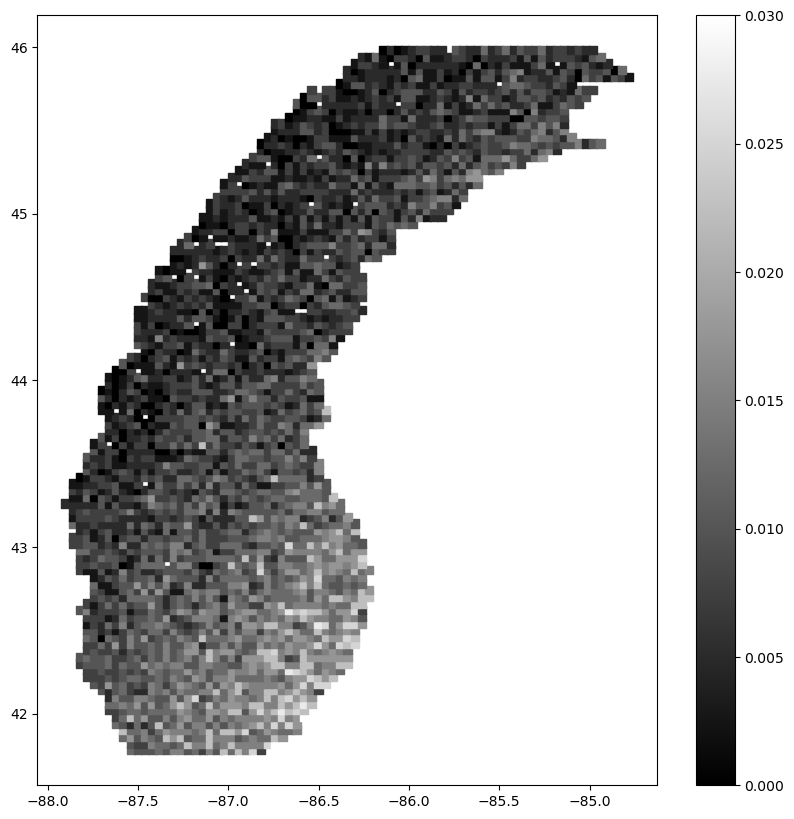

In [12]:
df_1 = pd.read_csv(zone_0_folder_path + file_list[1])

x_1, y_1, i_1 = df_1.longitude, df_1.latitude, df_1.value
plt.figure(figsize=(10, 10))
plt.scatter(x_1.values, y_1.values, c=i_1.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_1), len(y_1), len(i_1)

In [13]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_1 = np.nanmean(i_1.values)
std_i_1 = np.nanstd(i_1.values)

# Check number of nan values and 0s in i, just in case
num_nan_1 = i_1.isna().sum().sum()
num_zeros_1 = (i_1 == 0).sum().sum()

# Check min and max in i

i_1_max = i_1.max().max()
i_1_min = i_1.min().min()
i_1_mode = i_1.mode()[0]

print('Number of nan values in i_1 = ', num_nan_1)
print('Number of 0 values in i_1 = ', num_zeros_1)
print('Number of values in i_1 = ', len(i_1))
print('------------------------------------------------------')
print('Mean of values in i_1 = ', mean_i_1)
print('STD of 1-D values in i_1 = ', std_i_1)
print('Mean value >= STD =====> ', mean_i_1 >= std_i_1)
print('------------------------------------------------------')
print("Max value in i_1 = ", i_1_max)
print("Min value in i_1 = ", i_1_min)
print('Mode value in i_1 = ', i_1_mode)

Number of nan values in i_1 =  0
Number of 0 values in i_1 =  155
Number of values in i_1 =  3558
------------------------------------------------------
Mean of values in i_1 =  0.008943929010118043
STD of 1-D values in i_1 =  0.005206204872047027
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_1 =  0.03
Min value in i_1 =  0.0
Mode value in i_1 =  0.0075


In [14]:
# # Plot histogram
# plt.hist(i_1.values.flatten(), bins=50)

# # Set plot labels and title
# plt.xlabel('Value')
# plt.ylabel('Count')
# plt.title('Distribution of Values in DataFrame i_1')

# # Display plot
# plt.show()

fig = px.histogram(i_1.values.flatten(), title="Histogram of i_1")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

### 1.3 2016.12.08.1500

At `1500`, we assume that the sun has already gone up since **15:00 UTC** is **10:00 CDT**.

<img src="02-05-2023/testing_img/goes15.2016.12.08.1500.v01.nc.png" alt="image" width="50%">

As shown in the picture above, the cloud is visible in this case. Now, let's dive into the same process just to see what is going on.

One interesting fact I would like to point out is that how the number of points in the sample is `3,599`, which should be the ideal case. The previous cases all have less number of points in the datasets.

(3599, 3599, 3599)

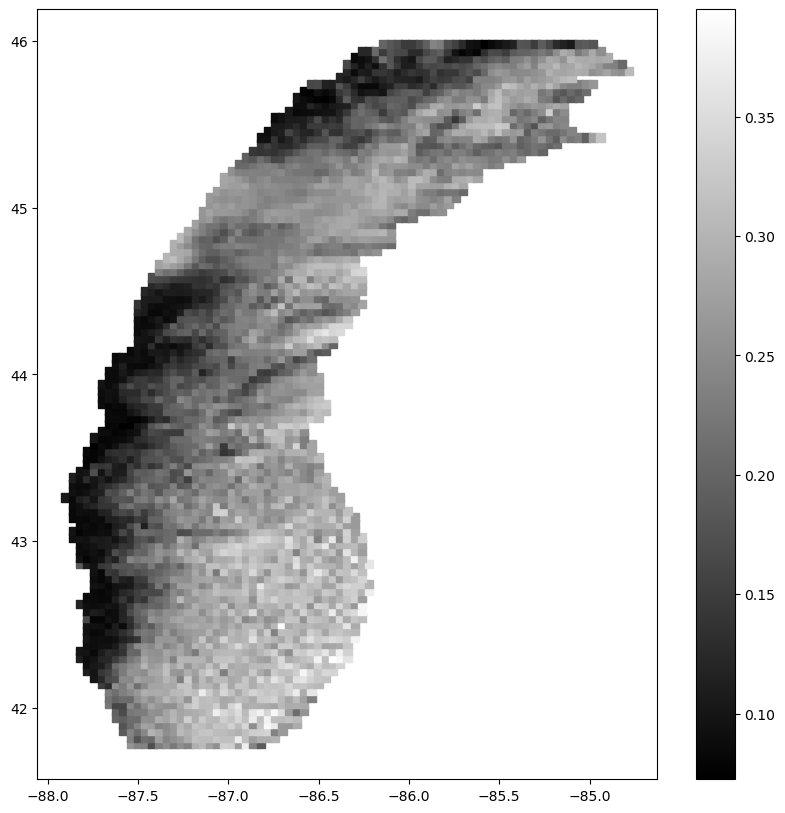

In [15]:
df_2 = pd.read_csv(zone_0_folder_path + file_list[2])

x_2, y_2, i_2 = df_2.longitude, df_2.latitude, df_2.value
plt.figure(figsize=(10, 10))
plt.scatter(x_2.values, y_2.values, c=i_2.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_2), len(y_2), len(i_2)

In [16]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_2 = np.nanmean(i_2.values)
std_i_2 = np.nanstd(i_2.values)

# Check number of nan values and 0s in i, just in case
num_nan_2 = i_2.isna().sum().sum()
num_zeros_2 = (i_2 == 0).sum().sum()

# Check min and max in i

i_2_max = i_2.max().max()
i_2_min = i_2.min().min()
i_2_mode = i_2.mode()[0]

print('Number of nan values in i_2 = ', num_nan_2)
print('Number of 0 values in i_2 = ', num_zeros_2)
print('Number of values in i_2 = ', len(i_2))
print('------------------------------------------------------')
print('Mean of values in i_2 = ', mean_i_2)
print('STD of 1-D values in i_2 = ', std_i_2)
print('Mean value >= STD =====> ', mean_i_2 >= std_i_2)
print('------------------------------------------------------')
print("Max value in i_2 = ", i_2_max)
print("Min value in i_2 = ", i_2_min)
print('Mode value in i_2 = ', i_2_mode)

Number of nan values in i_2 =  0
Number of 0 values in i_2 =  0
Number of values in i_2 =  3599
------------------------------------------------------
Mean of values in i_2 =  0.22888440950041677
STD of 1-D values in i_2 =  0.07059967323918688
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_2 =  0.39499998
Min value in i_2 =  0.0725
Mode value in i_2 =  0.2525


In [17]:
# # Plot histogram
# plt.hist(i_2.values.flatten(), bins=50)

# # Set plot labels and title
# plt.xlabel('Value')
# plt.ylabel('Count')
# plt.title('Distribution of Values in DataFrame i_2')

# # Display plot
# plt.show()

fig = px.histogram(i_2.values.flatten(), title="Histogram of i_2")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

### 1.4 2016.12.08.1530

At `1530`, we assume that the sun has already gone up since **15:30 UTC** is **10:30 CDT**.

<img src="02-05-2023/testing_img/goes15.2016.12.08.1530.v01.nc.png" alt="image" width="50%">

As shown in the picture above, the cloud is visible in this case. Now, let's dive into the same process just to see what is going on. 

(3599, 3599, 3599)

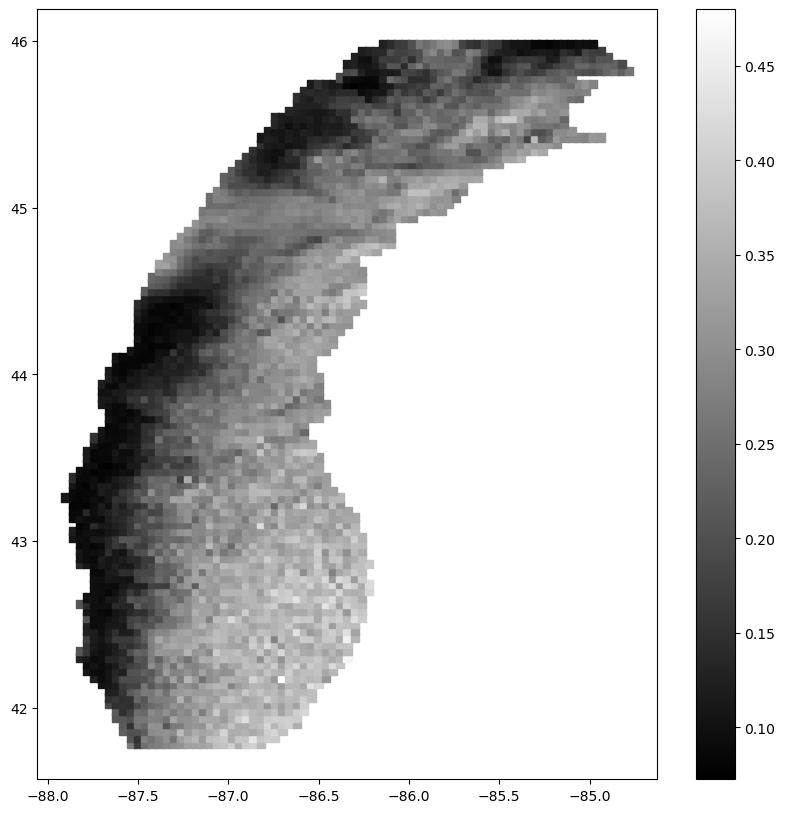

In [18]:
df_3 = pd.read_csv(zone_0_folder_path + file_list[3])

x_3, y_3, i_3 = df_3.longitude, df_3.latitude, df_3.value
plt.figure(figsize=(10, 10))
plt.scatter(x_3.values, y_3.values, c=i_3.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_3), len(y_3), len(i_3)

In [19]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_3 = np.nanmean(i_3.values)
std_i_3 = np.nanstd(i_3.values)

# Check number of nan values and 0s in i, just in case
num_nan_3 = i_3.isna().sum().sum()
num_zeros_3 = (i_3 == 0).sum().sum()

# Check min and max in i

i_3_max = i_3.max().max()
i_3_min = i_3.min().min()
i_3_mode = i_3.mode()[0]

print('Number of nan values in i_3 = ', num_nan_3)
print('Number of 0 values in i_3 = ', num_zeros_3)
print('Number of values in i_3 = ', len(i_3))
print('------------------------------------------------------')
print('Mean of values in i_3 = ', mean_i_3)
print('STD of 1-D values in i_3 = ', std_i_3)
print('Mean value >= STD =====> ', mean_i_3 >= std_i_3)
print('------------------------------------------------------')
print("Max value in i_3 = ", i_3_max)
print("Min value in i_3 = ", i_3_min)
print('Mode value in i_3 = ', i_3_mode)

Number of nan values in i_3 =  0
Number of 0 values in i_3 =  0
Number of values in i_3 =  3599
------------------------------------------------------
Mean of values in i_3 =  0.2517206131269797
STD of 1-D values in i_3 =  0.08945432948660141
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_3 =  0.48
Min value in i_3 =  0.0725
Mode value in i_3 =  0.3175


In [20]:
# # Plot histogram
# plt.hist(i_3.values.flatten(), bins=50)

# # Set plot labels and title
# plt.xlabel('Value')
# plt.ylabel('Count')
# plt.title('Distribution of Values in DataFrame i_3')

# # Display plot
# plt.show()

fig = px.histogram(i_3.values.flatten(), title="Histogram of i_3")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

### 1.5 2016.12.08.1545

At `1545`, we assume that the sun has already gone up since **15:45 UTC** is **10:45 CDT**.

<img src="02-05-2023/testing_img/goes15.2016.12.08.1545.v01.nc.png" alt="image" width="50%">

As shown in the picture above, the cloud is visible in this case. Now, let's dive into the same process just to see what is going on. 

(3599, 3599, 3599)

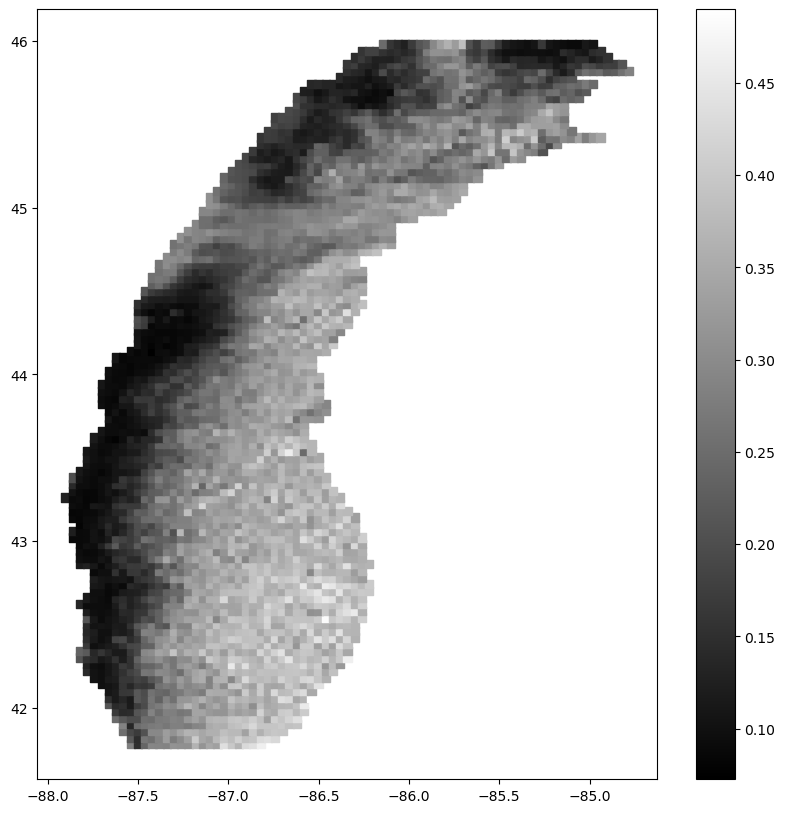

In [21]:
df_4 = pd.read_csv(zone_0_folder_path + file_list[4])

x_4, y_4, i_4 = df_4.longitude, df_4.latitude, df_4.value
plt.figure(figsize=(10, 10))
plt.scatter(x_4.values, y_4.values, c=i_4.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_4), len(y_4), len(i_4)


In [22]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_4 = np.nanmean(i_4.values)
std_i_4 = np.nanstd(i_4.values)

# Check number of nan values and 0s in i, just in case
num_nan_4 = i_4.isna().sum().sum()
num_zeros_4 = (i_4 == 0).sum().sum()

# Check min and max in i

i_4_max = i_4.max().max()
i_4_min = i_4.min().min()
i_4_mode = i_4.mode()[0]

print('Number of nan values in i_4 = ', num_nan_4)
print('Number of 0 values in i_4 = ', num_zeros_4)
print('Number of values in i_4 = ', len(i_4))
print('------------------------------------------------------')
print('Mean of values in i_4 = ', mean_i_4)
print('STD of 1-D values in i_4 = ', std_i_4)
print('Mean value >= STD =====> ', mean_i_4 >= std_i_4)
print('------------------------------------------------------')
print("Max value in i_4 = ", i_4_max)
print("Min value in i_4 = ", i_4_min)
print('Mode value in i_4 = ', i_4_mode)

Number of nan values in i_4 =  0
Number of 0 values in i_4 =  0
Number of values in i_4 =  3599
------------------------------------------------------
Mean of values in i_4 =  0.26068838185968324
STD of 1-D values in i_4 =  0.0964002509087906
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_4 =  0.48999998
Min value in i_4 =  0.0725
Mode value in i_4 =  0.3375


In [23]:
# # Plot histogram
# plt.hist(i_4.values.flatten(), bins=50)

# # Set plot labels and title
# plt.xlabel('Value')
# plt.ylabel('Count')
# plt.title('Distribution of Values in DataFrame i_4')

# # Display plot
# plt.show()

In [24]:
fig = px.histogram(i_4.values.flatten(), title="Histogram of i_4")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

### 1.6 Combine 2016.12.08.1500 till 2016.12.08.1700

At `1700`, we assume that the sun has already gone up since **17:00 UTC** is **12:00 CDT**.

<img src="02-05-2023/testing_img/goes15.2016.12.08.1700.v01.nc.png" alt="image" width="50%">

We now attempt to add the available set of data together and perform a simple analysis.

In [25]:
df_5 = pd.read_csv(zone_0_folder_path + file_list[5])
df_6 = pd.read_csv(zone_0_folder_path + file_list[6])
df_7 = pd.read_csv(zone_0_folder_path + file_list[7])
df_8 = pd.read_csv(zone_0_folder_path + file_list[8])
df_9 = pd.read_csv(zone_0_folder_path + file_list[9])

x_5, y_5, i_5 = df_4.longitude, df_5.latitude, df_5.value
x_6, y_6, i_6 = df_6.longitude, df_6.latitude, df_6.value
x_7, y_7, i_7 = df_7.longitude, df_7.latitude, df_7.value
x_8, y_8, i_8 = df_8.longitude, df_8.latitude, df_8.value
x_9, y_9, i_9 = df_9.longitude, df_9.latitude, df_9.value

In [26]:
# create a list of dataframes to be appended
df_case_0 = pd.concat([df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9], ignore_index = True)

df_case_0

,corresponding row,value,datetime,latitude,longitude,partition
0,7942,0.2600,2016-12-08 15:00:00,41.78,-87.54,0
1,7943,0.2400,2016-12-08 15:00:00,41.78,-87.50,0
2,7944,0.2375,2016-12-08 15:00:00,41.78,-87.46,0
3,7945,0.1700,2016-12-08 15:00:00,41.78,-87.42,0
4,7946,0.2325,2016-12-08 15:00:00,41.78,-87.38,0
...,...,...,...,...,...,...
28787,23438,0.2775,2016-12-08 17:00:00,45.98,-85.14,0
28788,23439,0.2200,2016-12-08 17:00:00,45.98,-85.10,0
28789,23440,0.2000,2016-12-08 17:00:00,45.98,-85.06,0
28790,23441,0.1650,2016-12-08 17:00:00,45.98,-85.02,0


(28792, 28792, 28792)

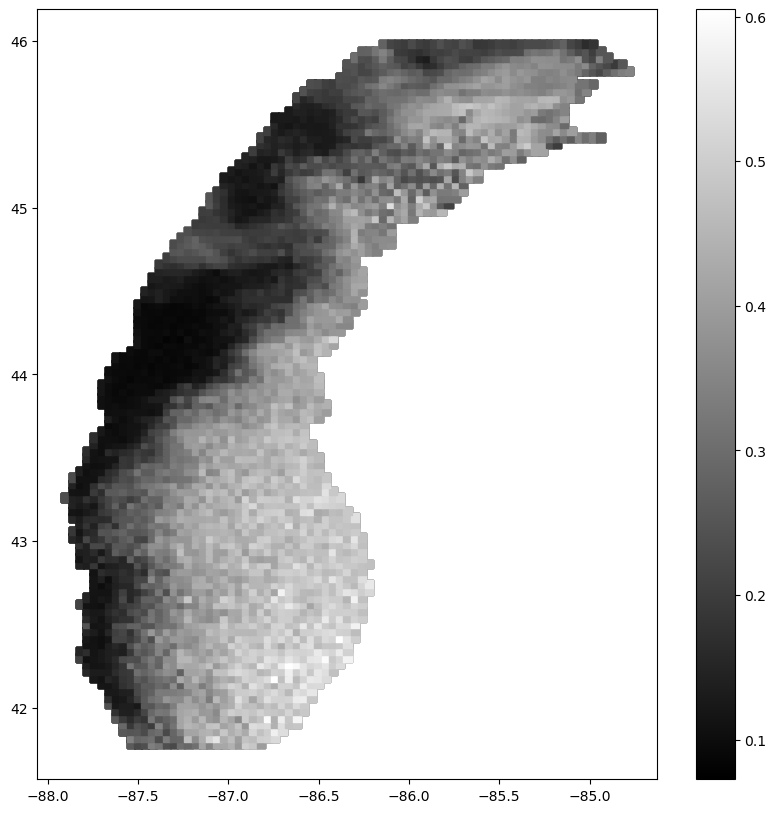

In [27]:
x_case_0, y_case_0, i_case_0 = df_case_0.longitude, df_case_0.latitude, df_case_0.value
plt.figure(figsize=(10, 10))
plt.scatter(x_case_0.values, y_case_0.values, c=i_case_0.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_case_0), len(y_case_0), len(i_case_0)

In [28]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_case_0 = np.nanmean(i_case_0.values)
std_i_case_0 = np.nanstd(i_case_0.values)

# Check number of nan values and 0s in i, just in case
num_nan_case_0 = i_case_0.isna().sum().sum()
num_zeros_case_0 = (i_case_0 == 0).sum().sum()

# Check min and max in i

i_case_0_max = i_case_0.max().max()
i_case_0_min = i_case_0.min().min()
i_case_0_mode = i_case_0.mode()[0]

print('Number of nan values in i_case_0 = ', num_nan_case_0)
print('Number of 0 values in i_case_0 = ', num_zeros_case_0)
print('Number of values in i_case_0 = ', len(i_case_0))
print('------------------------------------------------------')
print('Mean of values in i_case_0 = ', mean_i_case_0)
print('STD of 1-D values in i_case_0 = ', std_i_case_0)
print('Mean value >= STD =====> ', mean_i_case_0 >= std_i_case_0)
print('------------------------------------------------------')
print("Max value in i_case_0 = ", i_case_0_max)
print("Min value in i_case_0 = ", i_case_0_min)
print('Mode value in i_case_0 = ', i_case_0_mode)

Number of nan values in i_case_0 =  0
Number of 0 values in i_case_0 =  0
Number of values in i_case_0 =  28792
------------------------------------------------------
Mean of values in i_case_0 =  0.27718706176153096
STD of 1-D values in i_case_0 =  0.11081211274999676
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_case_0 =  0.60499996
Min value in i_case_0 =  0.0725
Mode value in i_case_0 =  0.29


In [29]:
fig = px.histogram(i_case_0.values.flatten(), title="Histogram of i_case_0")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

In [30]:
# If we were to reduce the values by the mode
i_case_0_modified = i_case_0.apply(lambda x: max(0, x - i_case_0_mode))

In [31]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_case_0_modified = np.nanmean(i_case_0_modified.values)
std_i_case_0_modified = np.nanstd(i_case_0_modified.values)

# Check number of nan values and 0s in i, just in case
num_nan_case_0_modified = i_case_0_modified.isna().sum().sum()
num_zeros_case_0_modified = (i_case_0_modified == 0).sum().sum()

# Check min and max in i

i_case_0_modified_max = i_case_0_modified.max().max()
i_case_0_modified_min = i_case_0_modified.min().min()
i_case_0_modified_mode = i_case_0_modified.mode()[0]

print('Number of nan values in i_case_0_modified = ', num_nan_case_0_modified)
print('Number of 0 values in i_case_0_modified = ', num_zeros_case_0_modified)
print('Number of values in i_case_0_modified = ', len(i_case_0_modified))
print('------------------------------------------------------')
print('Mean of values in i_case_0_modified = ', mean_i_case_0_modified)
print('STD of 1-D values in i_case_0_modified = ', std_i_case_0_modified)
print('Mean value >= STD =====> ', mean_i_case_0_modified >= std_i_case_0_modified)
print('------------------------------------------------------')
print("Max value in i_case_0_modified = ", i_case_0_modified_max)
print("Min value in i_case_0_modified = ", i_case_0_modified_min)
print('Mode value in i_case_0_modified = ', i_case_0_modified_mode)

Number of nan values in i_case_0_modified =  0
Number of 0 values in i_case_0_modified =  15613
Number of values in i_case_0_modified =  28792
------------------------------------------------------
Mean of values in i_case_0_modified =  0.04018398925257016
STD of 1-D values in i_case_0_modified =  0.05911838400063641
Mean value >= STD =====>  False
------------------------------------------------------
Max value in i_case_0_modified =  0.31499996
Min value in i_case_0_modified =  0.0
Mode value in i_case_0_modified =  0.0


In [32]:
fig = px.histogram(i_case_0_modified.values.flatten(), title="Histogram of i_case_0_modified")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

(28792, 28792, 28792)

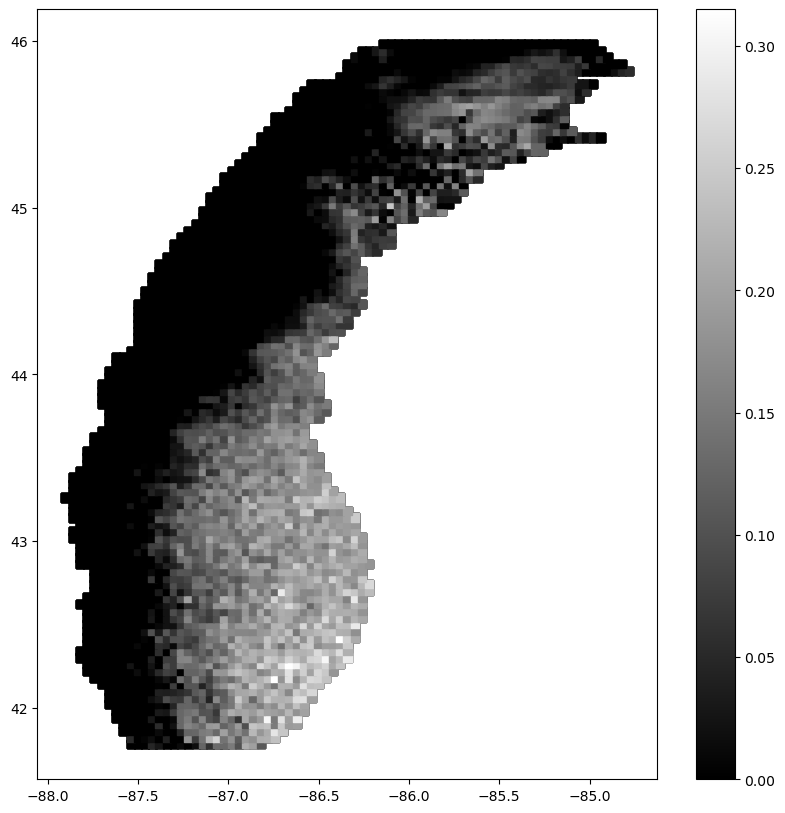

In [33]:
# x_case_0, y_case_0, i_case_0 = df_case_0.longitude, df_case_0.latitude, df_case_0.value
plt.figure(figsize=(10, 10))
plt.scatter(x_case_0.values, y_case_0.values, c=i_case_0_modified.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_case_0), len(y_case_0), len(i_case_0_modified)

In [34]:
# What if we reduce by mean - std of the sum

mean_minus_std_case_0 = mean_i_case_0 - std_i_case_0

print(mean_minus_std_case_0)

0.1663749490115342


In [35]:
# If we were to reduce the values by the mode
i_case_0_modified_ms = i_case_0.apply(lambda x: max(0, x - mean_minus_std_case_0))

In [36]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_case_0_modified_ms = np.nanmean(i_case_0_modified_ms.values)
std_i_case_0_modified_ms = np.nanstd(i_case_0_modified_ms.values)

# Check number of nan values and 0s in i, just in case
num_nan_case_0_modified_ms = i_case_0_modified_ms.isna().sum().sum()
num_zeros_case_0_modified_ms = (i_case_0_modified_ms == 0).sum().sum()

# Check min and max in i

i_case_0_modified_ms_max = i_case_0_modified_ms.max().max()
i_case_0_modified_ms_min = i_case_0_modified_ms.min().min()
i_case_0_modified_ms_mode = i_case_0_modified_ms.mode()[0]

print('Number of nan values in i_case_0_modified_ms = ', num_nan_case_0_modified_ms)
print('Number of 0 values in i_case_0_modified_ms = ', num_zeros_case_0_modified_ms)
print('Number of values in i_case_0_modified_ms = ', len(i_case_0_modified_ms))
print('------------------------------------------------------')
print('Mean of values in i_case_0_modified_ms = ', mean_i_case_0_modified_ms)
print('STD of 1-D values in i_case_0_modified_ms = ', std_i_case_0_modified_ms)
print('Mean value >= STD =====> ', mean_i_case_0_modified_ms >= std_i_case_0_modified_ms)
print('------------------------------------------------------')
print("Max value in i_case_0_modified_ms = ", i_case_0_modified_ms_max)
print("Min value in i_case_0_modified_ms = ", i_case_0_modified_ms_min)
print('Mode value in i_case_0_modified_ms = ', i_case_0_modified_ms_mode)

Number of nan values in i_case_0_modified_ms =  0
Number of 0 values in i_case_0_modified_ms =  5776
Number of values in i_case_0_modified_ms =  28792
------------------------------------------------------
Mean of values in i_case_0_modified_ms =  0.11982118526571715
STD of 1-D values in i_case_0_modified_ms =  0.09840863260882153
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_case_0_modified_ms =  0.4386250109884658
Min value in i_case_0_modified_ms =  0.0
Mode value in i_case_0_modified_ms =  0.0


In [37]:
fig = px.histogram(i_case_0_modified_ms.values.flatten(), title="Histogram of i_case_0_modified_ms")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

(28792, 28792, 28792)

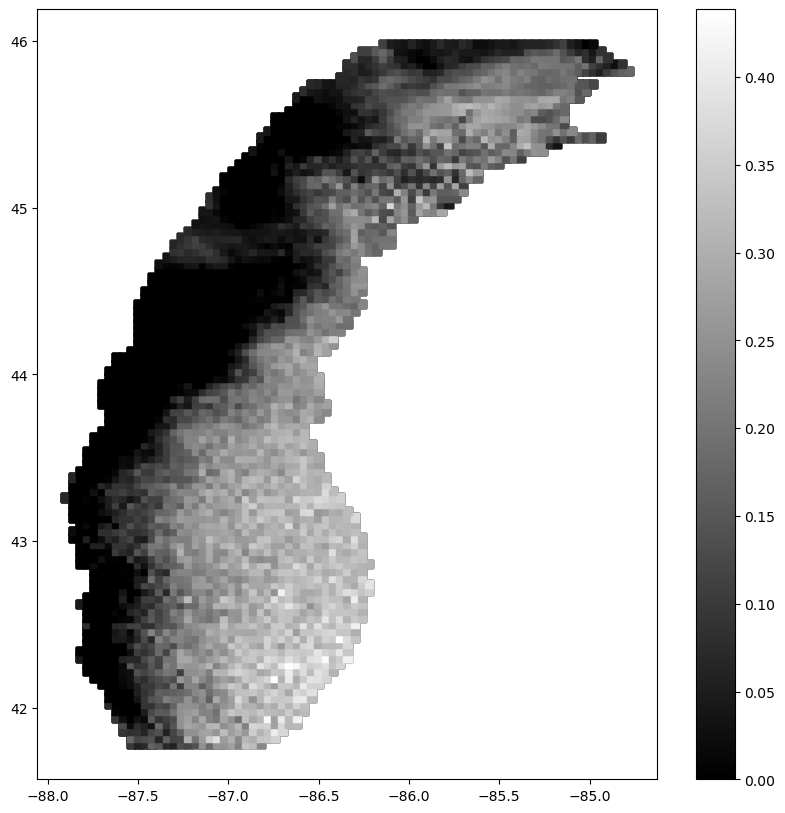

In [38]:
# x_case_0, y_case_0, i_case_0 = df_case_0.longitude, df_case_0.latitude, df_case_0.value
plt.figure(figsize=(10, 10))
plt.scatter(x_case_0.values, y_case_0.values, c=i_case_0_modified_ms.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_case_0), len(y_case_0), len(i_case_0_modified_ms)

In [39]:
# What if we reduce by 0.2

# If we were to reduce the values by 0.2 (hard cap)
i_case_0_modified_02 = i_case_0.apply(lambda x: max(0, x - 0.2))

In [40]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_case_0_modified_02 = np.nanmean(i_case_0_modified_02.values)
std_i_case_0_modified_02 = np.nanstd(i_case_0_modified_02.values)

# Check number of nan values and 0s in i, just in case
num_nan_case_0_modified_02 = i_case_0_modified_02.isna().sum().sum()
num_zeros_case_0_modified_02 = (i_case_0_modified_02 == 0).sum().sum()

# Check min and max in i

i_case_0_modified_02_max = i_case_0_modified_02.max().max()
i_case_0_modified_02_min = i_case_0_modified_02.min().min()
i_case_0_modified_02_mode = i_case_0_modified_02.mode()[0]

print('Number of nan values in i_case_0_modified_02 = ', num_nan_case_0_modified_02)
print('Number of 0 values in i_case_0_modified_02 = ', num_zeros_case_0_modified_02)
print('Number of values in i_case_0_modified_02 = ', len(i_case_0_modified_02))
print('------------------------------------------------------')
print('Mean of values in i_case_0_modified_02 = ', mean_i_case_0_modified_02)
print('STD of 1-D values in i_case_0_modified_02 = ', std_i_case_0_modified_02)
print('Mean value >= STD =====> ', mean_i_case_0_modified_02 >= std_i_case_0_modified_02)
print('------------------------------------------------------')
print("Max value in i_case_0_modified_02 = ", i_case_0_modified_02_max)
print("Min value in i_case_0_modified_02 = ", i_case_0_modified_02_min)
print('Mode value in i_case_0_modified_02 = ', i_case_0_modified_02_mode)

Number of nan values in i_case_0_modified_02 =  0
Number of 0 values in i_case_0_modified_02 =  8108
Number of values in i_case_0_modified_02 =  28792
------------------------------------------------------
Mean of values in i_case_0_modified_02 =  0.09422790712420116
STD of 1-D values in i_case_0_modified_02 =  0.08932539277076187
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_case_0_modified_02 =  0.40499996
Min value in i_case_0_modified_02 =  0.0
Mode value in i_case_0_modified_02 =  0.0


In [41]:
fig = px.histogram(i_case_0_modified_02.values.flatten(), title="Histogram of i_case_0_modified_02")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

(28792, 28792, 28792)

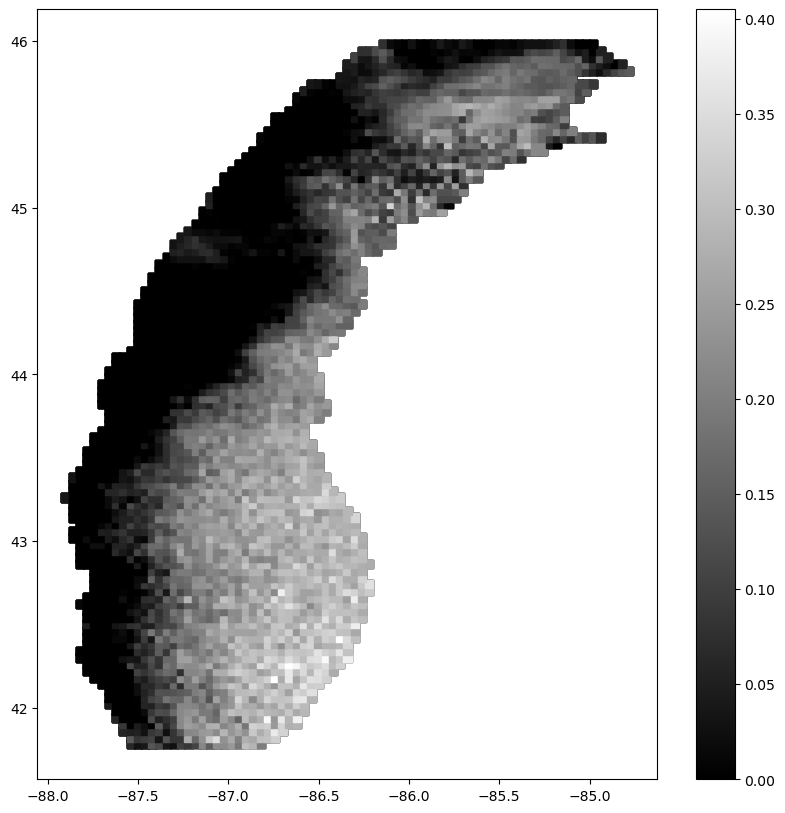

In [42]:
# x_case_0, y_case_0, i_case_0 = df_case_0.longitude, df_case_0.latitude, df_case_0.value
plt.figure(figsize=(10, 10))
plt.scatter(x_case_0.values, y_case_0.values, c=i_case_0_modified_02.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_case_0), len(y_case_0), len(i_case_0_modified_02)

---

Observation:

It still seems to me that we shall deduct `mean - 1 x std` as the threshold, across the given day.

---

---

### EXPERIMENT:

Call me stoopid if you will, let's try to see if it is going to split into 2 normal distributions?

---

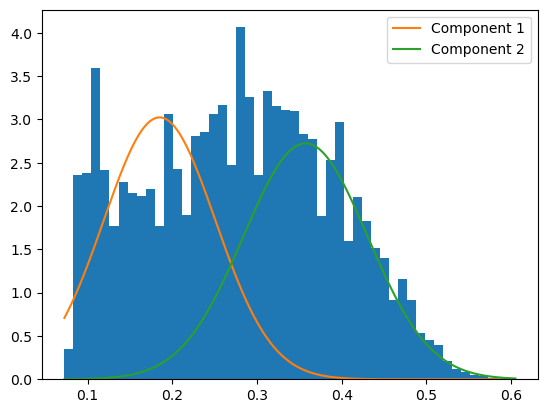

In [43]:
xx_case_0 = np.array(i_case_0).reshape(-1, 1)

# Fit a mixture of two Gaussians to the data
gmm_case_0 = GaussianMixture(n_components=2).fit(xx_case_0)

# Get the means and standard deviations of the two Gaussian components
mu1_case_0, mu2_case_0 = gmm_case_0.means_.flatten()
sigma1_case_0, sigma2_case_0 = np.sqrt(gmm_case_0.covariances_.flatten())

# Visualize the results
plt.hist(i_case_0, density=True, bins = 50)
# x_axis = i_11.unique()
xx_axis_case_0 = np.linspace(min(i_case_0), max(i_case_0), 3000)
plt.plot(xx_axis_case_0, 0.5 * np.exp(-(xx_axis_case_0 - mu1_case_0)**2 / (2 * sigma1_case_0**2)) / sigma1_case_0 / np.sqrt(2 * np.pi), label='Component 1')
plt.plot(xx_axis_case_0, 0.5 * np.exp(-(xx_axis_case_0 - mu2_case_0)**2 / (2 * sigma2_case_0**2)) / sigma2_case_0 / np.sqrt(2 * np.pi), label='Component 2')
plt.legend()
plt.show()

In [44]:
print('The mean of the 1st normal distribution = ', mu1_case_0)
print('The mean of the 2nd normal distribution = ', mu2_case_0)

The mean of the 1st normal distribution =  0.1848959908824051
The mean of the 2nd normal distribution =  0.3572160740660535


In [45]:
print('The std of the 1st normal distribution = ', sigma1_case_0)
print('The std of the 2nd normal distribution = ', sigma2_case_0)

The std of the 1st normal distribution =  0.0659800642547393
The std of the 2nd normal distribution =  0.07323575289578128


In [46]:
# Define the two normal distributions
mean1, std1 = mu1_case_0, sigma1_case_0
mean2, std2 = mu2_case_0, sigma2_case_0

dist1 = norm(mean1, std1)
dist2 = norm(mean2, std2)

# Define a function to find the difference between the two distributions
def diff(x):
    return dist1.pdf(x) - dist2.pdf(x)

# Use fsolve to find the x value where the difference is zero
x_cross = fsolve(diff, x0=(mean1+mean2)/2)

print("Cross point of two normal distributions: x =", x_cross[0])

Cross point of two normal distributions: x = 0.2694859381437521


#### My $0.02 here

`What-if`: We filter based on the cross point?

The cross point of two normal distributions is the point where the two distributions intersect. This point is significant because it represents the value at which the probability of observing a particular outcome is equal under both distributions.

When two normal distributions intersect, they have the same mean, but they may have different standard deviations. The point of intersection is also known as the "crossover point" or "break-even point."

The location of the cross point can be used to make statistical inferences about the populations represented by the two distributions. For example, if the cross point is close to the mean of one distribution but far from the mean of the other distribution, this may indicate that the two populations are distinct and have different characteristics.

The cross point can also be used to calculate the probability that an observation comes from one distribution versus the other. This can be useful in a variety of fields, including finance, economics, and psychology, where researchers may be interested in comparing the characteristics of different groups or populations.

Therefore, when it comes to the current situation, we assume that there are two groups in the picture, one group of pixels are non-cloud pixels, another group would inevitably be the cloud pixels. Then, the value of intensity at the cross point/intersect shall be considered as the threshold value.

In [47]:
# What if we reduce by x_cross

# If we were to reduce the values by x_cross value as mentioned above
i_case_0_modified_x_cross = i_case_0.apply(lambda x: max(0, x - x_cross[0]))

In [48]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_case_0_modified_x_cross = np.nanmean(i_case_0_modified_x_cross.values)
std_i_case_0_modified_x_cross = np.nanstd(i_case_0_modified_x_cross.values)

# Check number of nan values and 0s in i, just in case
num_nan_case_0_modified_x_cross = i_case_0_modified_x_cross.isna().sum().sum()
num_zeros_case_0_modified_x_cross = (i_case_0_modified_x_cross == 0).sum().sum()

# Check min and max in i

i_case_0_modified_x_cross_max = i_case_0_modified_x_cross.max().max()
i_case_0_modified_x_cross_min = i_case_0_modified_x_cross.min().min()
# i_case_0_modified_x_cross_min = 0
i_case_0_modified_x_cross_mode = i_case_0_modified_x_cross.mode()[0]

print('Number of nan values in i_case_0_modified_x_cross = ', num_nan_case_0_modified_x_cross)
print('Number of 0 values in i_case_0_modified_x_cross = ', num_zeros_case_0_modified_x_cross)
print('Number of values in i_case_0_modified_x_cross = ', len(i_case_0_modified_x_cross))
print('------------------------------------------------------')
print('Mean of values in i_case_0_modified_x_cross = ', mean_i_case_0_modified_x_cross)
print('STD of 1-D values in i_case_0_modified_x_cross = ', std_i_case_0_modified_x_cross)
print('Mean value >= STD =====> ', mean_i_case_0_modified_x_cross >= std_i_case_0_modified_x_cross)
print('------------------------------------------------------')
print("Max value in i_case_0_modified_x_cross = ", i_case_0_modified_x_cross_max)
print("Min value in i_case_0_modified_x_cross = ", i_case_0_modified_x_cross_min)
print('Mode value in i_case_0_modified_x_cross = ', i_case_0_modified_x_cross_mode)

Number of nan values in i_case_0_modified_x_cross =  0
Number of 0 values in i_case_0_modified_x_cross =  13598
Number of values in i_case_0_modified_x_cross =  28792
------------------------------------------------------
Mean of values in i_case_0_modified_x_cross =  0.05040864040024418
STD of 1-D values in i_case_0_modified_x_cross =  0.06650027079436928
Mean value >= STD =====>  False
------------------------------------------------------
Max value in i_case_0_modified_x_cross =  0.3355140218562479
Min value in i_case_0_modified_x_cross =  0.0
Mode value in i_case_0_modified_x_cross =  0.0


In [49]:
fig = px.histogram(i_case_0_modified_x_cross.values.flatten(), title="Histogram of i_case_0_modified_x_cross")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

(28792, 28792, 28792)

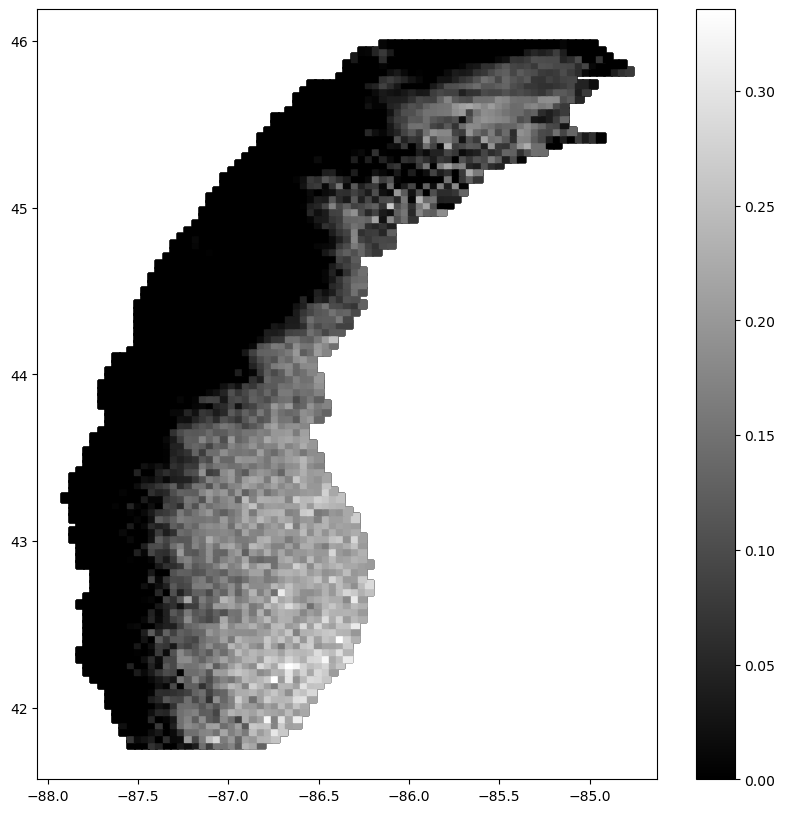

In [50]:
# x_case_0, y_case_0, i_case_0 = df_case_0.longitude, df_case_0.latitude, df_case_0.value
plt.figure(figsize=(10, 10))
plt.scatter(x_case_0.values, y_case_0.values, c=i_case_0_modified_x_cross.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_case_0), len(y_case_0), len(i_case_0_modified_x_cross)

## 2. Case 2

`Duration`: 2016.12.09 1200-1600 UTC

<img src="02-05-2023/testing_img/goes15.2016.12.09.1500.v01.nc.png" alt="image" width="50%">

> [Q]:

> In this case, we can see that the day starts at 1300 UTC, aka 8AM CDT. Around that time, cloud was barely visible. However, in each 15 mins, the intensity of the cloud goes up significantly, we can see clouds that sort follow SLAP pattern (short-lake axis parallel). Just want to check with you if you think at 1500 (the second image), if the cloud exists. The intensity of the cloud is low across the board.

> [A]:

> Yes, this is a good use case. I think we need to ensure that the threshold is not higher than the 1500 image, because that is a definite cloud

### 2.1 2016.12.09.1200

But before this, let's take a look at what happened at `1200`.

<img src="02-05-2023/testing_img/goes15.2016.12.09.1200.v01.nc.png" alt="image" width="50%">

As we can see, there are blue noises on the image in the Lake Michigan area.

(2418, 2418, 2418)

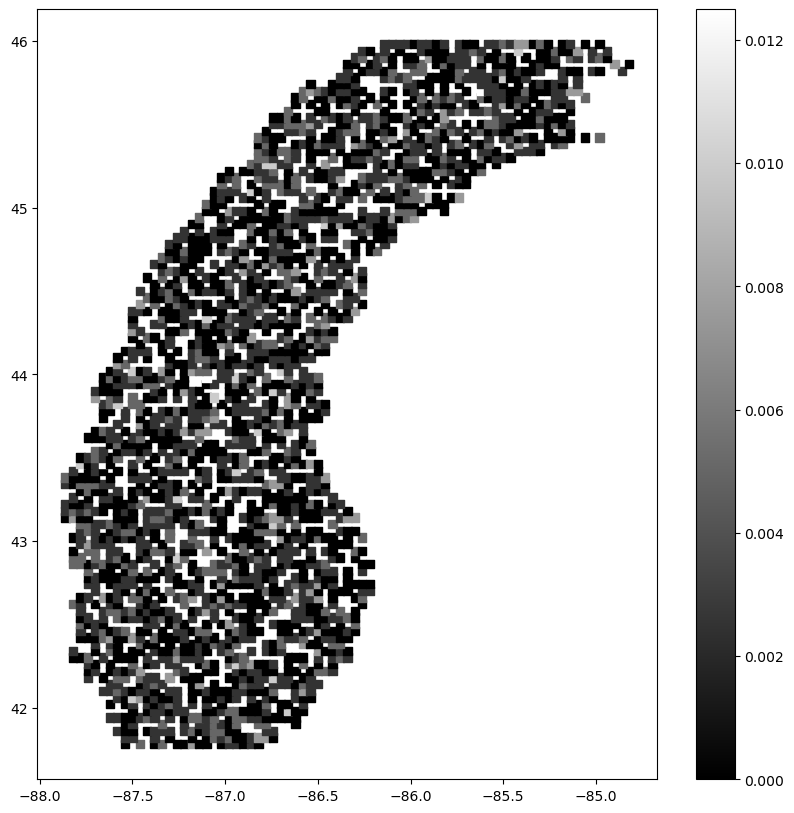

In [51]:
df_10 = pd.read_csv(zone_0_folder_path + file_list[10])

x_10, y_10, i_10 = df_10.longitude, df_10.latitude, df_10.value
plt.figure(figsize=(10, 10))
plt.scatter(x_10.values, y_10.values, c=i_10.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_10), len(y_10), len(i_10)

In [52]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_10 = np.nanmean(i_10.values)
std_i_10 = np.nanstd(i_10.values)

# Check number of nan values and 0s in i, just in case
num_nan_10 = i_10.isna().sum().sum()
num_zeros_10 = (i_10 == 0).sum().sum()

# Check min and max in i

i_10_max = i_10.max().max()
i_10_min = i_10.min().min()
i_10_mode = i_10.mode()[0]

print('Number of nan values in i_10 = ', num_nan_10)
print('Number of 0 values in i_10 = ', num_zeros_10)
print('Number of values in i_10 = ', len(i_10))
print('------------------------------------------------------')
print('Mean of values in i_10 = ', mean_i_10)
print('STD of 1-D values in i_10 = ', std_i_10)
print('Mean value >= STD =====> ', mean_i_10 >= std_i_10)
print('------------------------------------------------------')
print("Max value in i_10 = ", i_10_max)
print("Min value in i_10 = ", i_10_min)
print('Mode value in i_10 = ', i_10_mode)

Number of nan values in i_10 =  0
Number of 0 values in i_10 =  1064
Number of values in i_10 =  2418
------------------------------------------------------
Mean of values in i_10 =  0.002081265507444169
STD of 1-D values in i_10 =  0.0022845347341692427
Mean value >= STD =====>  False
------------------------------------------------------
Max value in i_10 =  0.012499999
Min value in i_10 =  0.0
Mode value in i_10 =  0.0


In [53]:
fig = px.histogram(i_10.values.flatten(), title="Histogram of i_10")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

In [54]:
len(i_10) - len(i_0)

72

In [55]:
# Since they have different length, we try to perform an union join, aka outer join
df_i_0_i_10 = pd.merge(df_0, df_10, on=['longitude', 'latitude'], how='outer')
df_i_0_i_10

,corresponding row_x,value_x,datetime_x,latitude,longitude,partition_x,corresponding row_y,value_y,datetime_y,partition_y
0,5360.0,0.0025,2016-12-08 12:00:00,41.78,-87.54,0.0,5305.0,0.0000,2016-12-09 12:00:00,0.0
1,5361.0,0.0025,2016-12-08 12:00:00,41.78,-87.50,0.0,NaN,NaN,NaN,NaN
2,5362.0,0.0025,2016-12-08 12:00:00,41.78,-87.46,0.0,5306.0,0.0050,2016-12-09 12:00:00,0.0
3,5363.0,0.0000,2016-12-08 12:00:00,41.78,-87.42,0.0,NaN,NaN,NaN,NaN
4,5364.0,0.0000,2016-12-08 12:00:00,41.78,-87.38,0.0,5307.0,0.0000,2016-12-09 12:00:00,0.0
...,...,...,...,...,...,...,...,...,...,...
3166,NaN,NaN,NaN,45.98,-85.50,NaN,18118.0,0.0050,2016-12-09 12:00:00,0.0
3167,NaN,NaN,NaN,45.98,-85.46,NaN,18119.0,0.0025,2016-12-09 12:00:00,0.0
3168,NaN,NaN,NaN,45.98,-85.34,NaN,18122.0,0.0000,2016-12-09 12:00:00,0.0
3169,NaN,NaN,NaN,45.98,-85.30,NaN,18123.0,0.0050,2016-12-09 12:00:00,0.0


In [56]:
df_i_0_i_10 = df_i_0_i_10.fillna(0)

df_i_0_i_10['delta_value'] = df_i_0_i_10['value_x'] - df_i_0_i_10['value_y']
df_i_0_i_10

,corresponding row_x,value_x,datetime_x,latitude,longitude,partition_x,corresponding row_y,value_y,datetime_y,partition_y,delta_value
0,5360.0,0.0025,2016-12-08 12:00:00,41.78,-87.54,0.0,5305.0,0.0000,2016-12-09 12:00:00,0.0,0.0025
1,5361.0,0.0025,2016-12-08 12:00:00,41.78,-87.50,0.0,0.0,0.0000,0,0.0,0.0025
2,5362.0,0.0025,2016-12-08 12:00:00,41.78,-87.46,0.0,5306.0,0.0050,2016-12-09 12:00:00,0.0,-0.0025
3,5363.0,0.0000,2016-12-08 12:00:00,41.78,-87.42,0.0,0.0,0.0000,0,0.0,0.0000
4,5364.0,0.0000,2016-12-08 12:00:00,41.78,-87.38,0.0,5307.0,0.0000,2016-12-09 12:00:00,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...
3166,0.0,0.0000,0,45.98,-85.50,0.0,18118.0,0.0050,2016-12-09 12:00:00,0.0,-0.0050
3167,0.0,0.0000,0,45.98,-85.46,0.0,18119.0,0.0025,2016-12-09 12:00:00,0.0,-0.0025
3168,0.0,0.0000,0,45.98,-85.34,0.0,18122.0,0.0000,2016-12-09 12:00:00,0.0,0.0000
3169,0.0,0.0000,0,45.98,-85.30,0.0,18123.0,0.0050,2016-12-09 12:00:00,0.0,-0.0050


In [57]:
fig = px.histogram(df_i_0_i_10['delta_value'], title="Histogram of df_i_0_i_10['delta_value']")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

It seems that there is little to no difference between days at `1200` before sun goes up. And the max values are all under 0.02. Let's dive into other hours and see the differences.

### 2.2 2016.12.09.1400

At `1400`, we assume that the sun is going up since **14:00 UTC** is **9:00 CDT**.

<img src="02-05-2023/testing_img/goes15.2016.12.09.1400.v01.nc.png" alt="image" width="50%">

The sun rises, and we can see the cloud clearly.

In [58]:
df_11 = pd.read_csv(zone_0_folder_path + file_list[11])

print(file_list[11])

goes15.2016.12.09.1400.v01.nc-var1-t0.csv


(3599, 3599, 3599)

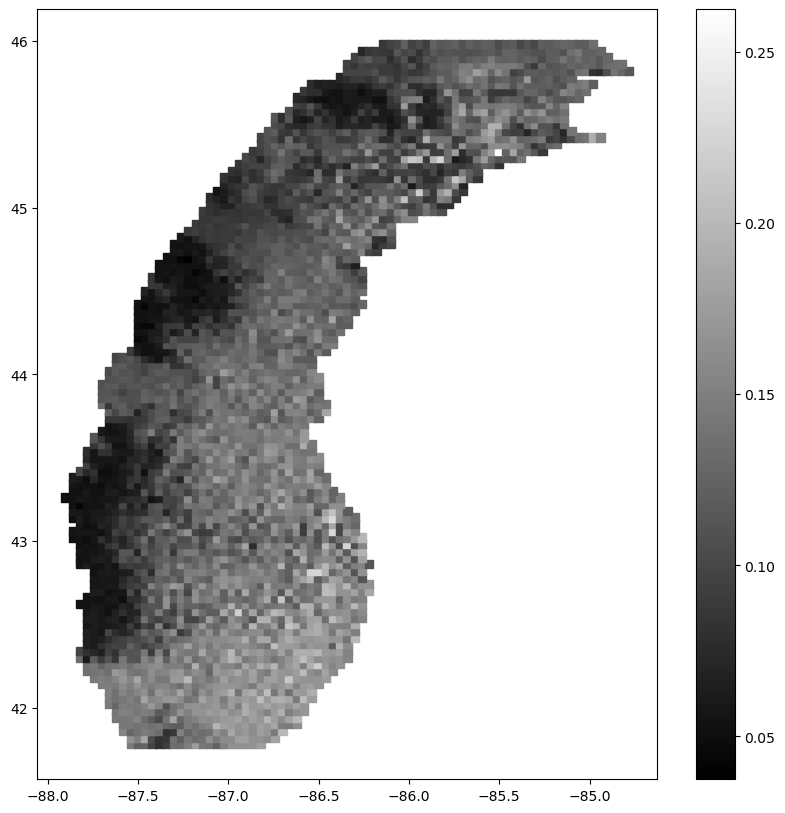

In [59]:
x_11, y_11, i_11 = df_11.longitude, df_11.latitude, df_11.value
plt.figure(figsize=(10, 10))
plt.scatter(x_11.values, y_11.values, c=i_11.values, cmap=cm.gray, marker='s')
plt.colorbar(orientation='vertical')
len(x_11), len(y_11), len(i_11)

In [60]:
# Calculate the mean and standard deviation of the 1-D array

mean_i_11 = np.nanmean(i_11.values)
std_i_11 = np.nanstd(i_11.values)

# Check number of nan values and 0s in i, just in case
num_nan_11 = i_11.isna().sum().sum()
num_zeros_11 = (i_11 == 0).sum().sum()

# Check min and max in i

i_11_max = i_11.max().max()
i_11_min = i_11.min().min()
i_11_mode = i_11.mode()[0]

print('Number of nan values in i_11 = ', num_nan_11)
print('Number of 0 values in i_11 = ', num_zeros_11)
print('Number of values in i_11 = ', len(i_11))
print('------------------------------------------------------')
print('Mean of values in i_11 = ', mean_i_11)
print('STD of 1-D values in i_11 = ', std_i_11)
print('Mean value >= STD =====> ', mean_i_11 >= std_i_11)
print('------------------------------------------------------')
print("Max value in i_11 = ", i_11_max)
print("Min value in i_11 = ", i_11_min)
print('Mode value in i_11 = ', i_11_mode)

Number of nan values in i_11 =  0
Number of 0 values in i_11 =  0
Number of values in i_11 =  3599
------------------------------------------------------
Mean of values in i_11 =  0.12021603039955543
STD of 1-D values in i_11 =  0.0361471038703567
Mean value >= STD =====>  True
------------------------------------------------------
Max value in i_11 =  0.2625
Min value in i_11 =  0.037499998
Mode value in i_11 =  0.1175


In [61]:
fig = px.histogram(i_11.values.flatten(), title="Histogram of i_11")
fig.update_xaxes(title_text="Value")
fig.update_yaxes(title_text="Count")

# Show the plot
fig.show()

---

### EXPERIMENT:

Call me stoopid if you will, let's try to see if it is going to split into 2 normal distributions?

---

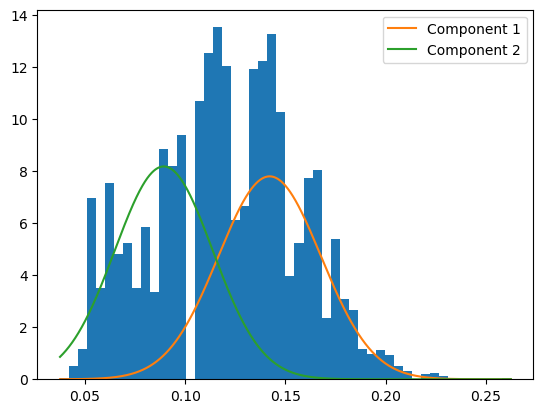

In [62]:
x = np.array(i_11).reshape(-1, 1)

# Fit a mixture of two Gaussians to the data
gmm = GaussianMixture(n_components=2).fit(x)

# Get the means and standard deviations of the two Gaussian components
mu1, mu2 = gmm.means_.flatten()
sigma1, sigma2 = np.sqrt(gmm.covariances_.flatten())

# Visualize the results
plt.hist(i_11, density=True, bins = 50)
# x_axis = i_11.unique()
x_axis = np.linspace(min(i_11), max(i_11), 3000)
plt.plot(x_axis, 0.5 * np.exp(-(x_axis - mu1)**2 / (2 * sigma1**2)) / sigma1 / np.sqrt(2 * np.pi), label='Component 1')
plt.plot(x_axis, 0.5 * np.exp(-(x_axis - mu2)**2 / (2 * sigma2**2)) / sigma2 / np.sqrt(2 * np.pi), label='Component 2')
plt.legend()
plt.show()

In [63]:
print('The mean of the 1st normal distribution = ', mu1)
print('The mean of the 2nd normal distribution = ', mu2)

The mean of the 1st normal distribution =  0.14210570733156763
The mean of the 2nd normal distribution =  0.08926217215944066


In [64]:
print('The std of the 1st normal distribution = ', sigma1)
print('The std of the 2nd normal distribution = ', sigma2)

The std of the 1st normal distribution =  0.02558748858681586
The std of the 2nd normal distribution =  0.02439566817429083
